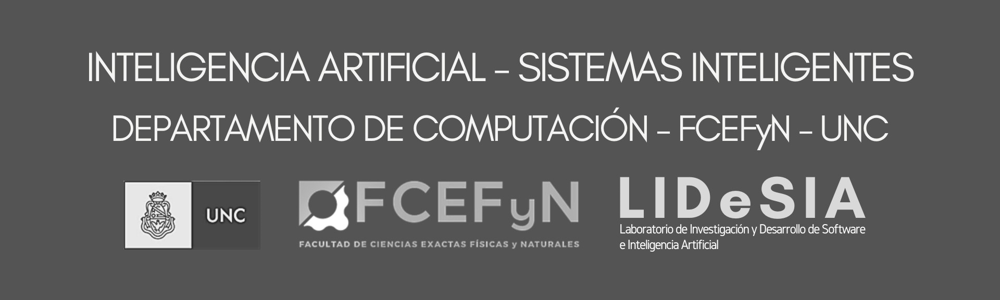

# Introducción a YOLO (You Only Look Once)

FCEFyN - UNC - Cátedra de Inteligencia Artificial

**Autor:** Ing. Ángel Nicolás Heredia. (LIDeSIA - FCEFyN)  
**Directora:** Dra. Laura Cecilia Diaz Davila (LIDeSIA - FCEFyN)

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.6/112.6 GB disk)




<img src="https://repository-images.githubusercontent.com/535360445/2a2c855b-932c-4625-a30d-3a0b475f1051" alt="Texto alternativo" width="500">


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Tareas que puede ejecutar YOLOv11

Las tareas que se pueden llevar a cabo con YOLOv11 son:

*   [Clasificar](https://docs.ultralytics.com/tasks/classify/)
*   [Detectar](https://docs.ultralytics.com/tasks/detect/)
*   [Segmentar](https://docs.ultralytics.com/tasks/segment/)
*   [Pose](https://docs.ultralytics.com/tasks/pose/)
*   [OBB (Oriented Bounding Boxes)](https://docs.ultralytics.com/tasks/obb/)





Los modelos Detect, Segment y Pose están previamente entrenados en el conjunto de datos [COCO](https://cocodataset.org/#home), mientras que los modelos Classify están previamente entrenados en el conjunto de datos ImageNet y los modelos OBB con DOTAv1.

Para cada una de estas tareas Ultralytics nos provee cinco modelos.

![cuadro](https://drive.google.com/uc?id=11ER8U2WtqGzTMB0EmFSENZ9G1mK64szE)


### Detectar objetos en una imagen

In [ ]:
from ultralytics import YOLO


image 1/1 /content/drive/MyDrive/YOLO_class/presentation_images/akira_detect.jpg: 640x512 1 cat, 1 sports ball, 1 chair, 1359.1ms
Speed: 3.4ms preprocess, 1359.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 512)


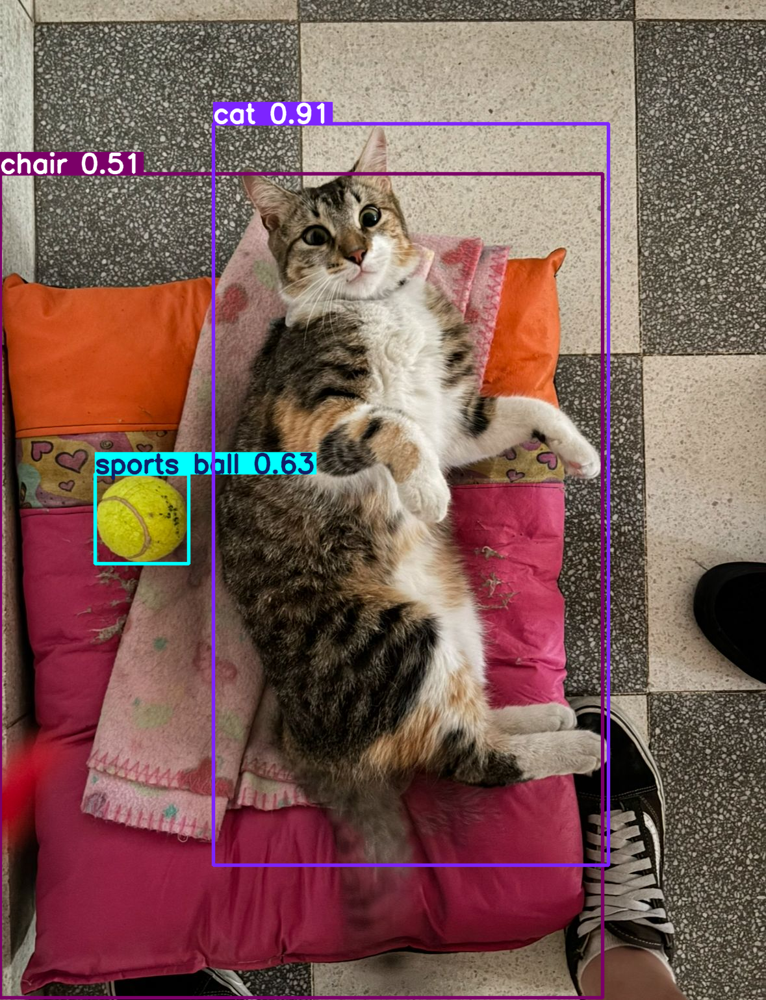

In [ ]:
# Load a model
model = YOLO("yolo11l.pt")  # pretrained YOLO11n model

# Realizar la detección
results = model('/content/drive/MyDrive/YOLO_class/presentation_images/akira_detect.jpg');

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    #masks = result.masks  # Masks object for segmentation masks outputs
    #keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    #obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename="result_1.jpg")  # save to disk

## Segmentar objetos en una imagen

100%|██████████| 5.90M/5.90M [00:00<00:00, 103MB/s]


100%|██████████| 134k/134k [00:00<00:00, 7.60MB/s]


image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 274.8ms
Speed: 3.0ms preprocess, 274.8ms inference, 20.0ms postprocess per image at shape (1, 3, 640, 480)


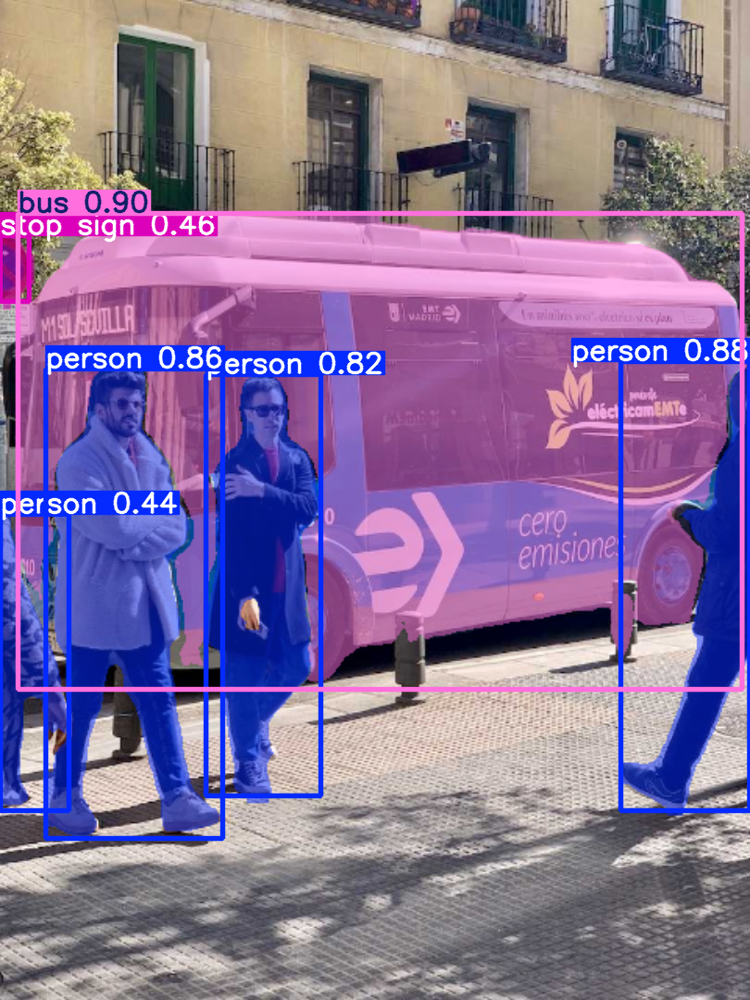

In [ ]:
# Load a model
model = YOLO("yolo11n-seg.pt")  # pretrained YOLO11n model

# Realizar la detección
results = model('https://ultralytics.com/images/bus.jpg');

# Process results list
for result in results:
    masks = result.masks  # Masks object for segmentation masks outputs
    result.show()  # display to screen
    result.save(filename="result_2.jpg")  # save to disk

## Pose

100%|██████████| 5.97M/5.97M [00:00<00:00, 85.0MB/s]


100%|██████████| 179k/179k [00:00<00:00, 679kB/s]

image 1/1 /content/Usain-Bolt-Manchester-CityGames-2009-by-The-Great-Run-Company.jpg: 384x640 5 persons, 146.4ms
Speed: 2.4ms preprocess, 146.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


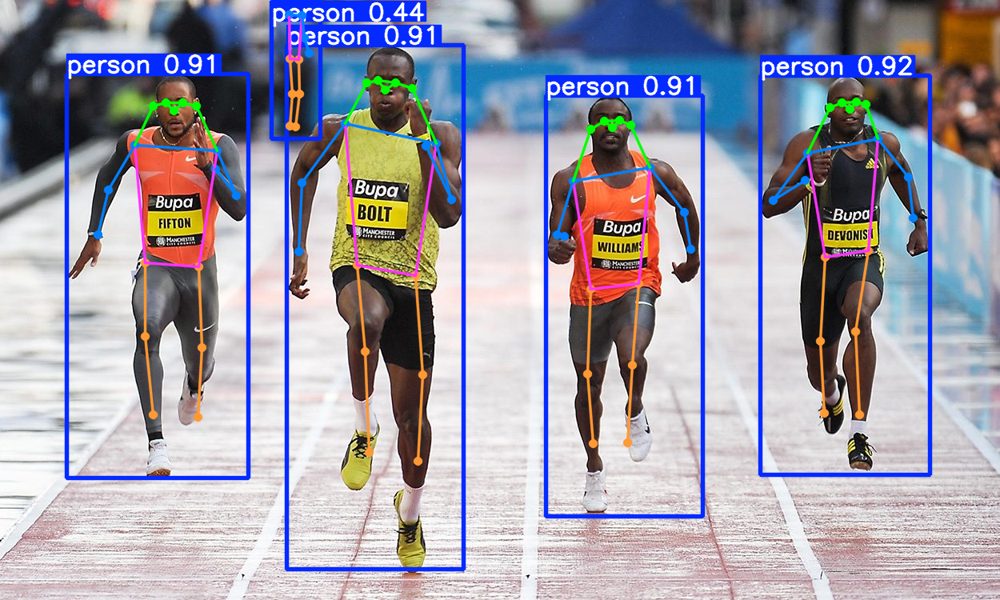

In [ ]:
# Load a model
model = YOLO("yolo11n-pose.pt")  # pretrained YOLO11n model

# Realizar la detección
results = model('https://athleticsweekly.com/wp-content/uploads/2018/05/Usain-Bolt-Manchester-CityGames-2009-by-The-Great-Run-Company.jpg');

# Process results list
for result in results:
    masks = result.masks  # Masks object for segmentation masks outputs
    result.show()  # display to screen
    result.save(filename="result_3.jpg")  # save to disk

## OBB (Oriented Bounding Boxes)


100%|██████████| 5.53M/5.53M [00:00<00:00, 100MB/s]


100%|██████████| 74.3k/74.3k [00:00<00:00, 196kB/s]


image 1/1 /content/vista-barcos-aguas-tranquilas-arriba_410516-23241.jpg: 704x1024 351.3ms
Speed: 6.9ms preprocess, 351.3ms inference, 18.8ms postprocess per image at shape (1, 3, 704, 1024)


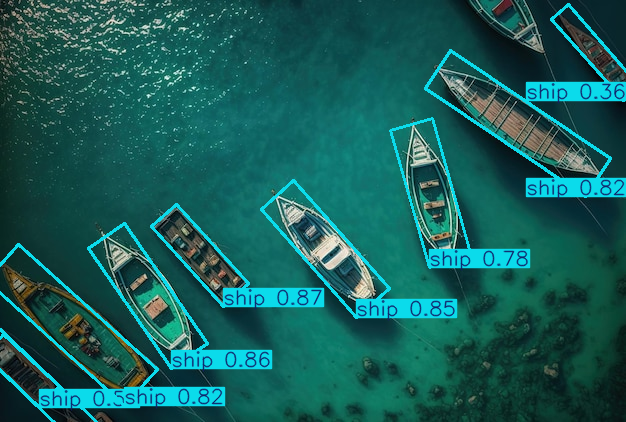

In [ ]:
# Load a model
model = YOLO("yolo11n-obb.pt")  # pretrained YOLO11n model

# Realizar la detección
results = model('https://img.freepik.com/fotos-premium/vista-barcos-aguas-tranquilas-arriba_410516-23241.jpg')
# Process results list
for result in results:
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename="result_4.jpg")  # save to disk

## ¿Qué sucede si necesito detectar otras clases que no estan incluidas en COCO?

[YOLO](https://docs.ultralytics.com/modes/train/) -------> Transfer Learning

Pasos para usar YOLO como transfer:
1. Obtener las imagenes
2. Etiquetar las imagenes
3. Entrenar el modelo
4. Testear
5. Recordar que todos estos procesos son iterativos

### **¿Como etiquetamos?**

[Roboflow](https://roboflow.com/annotate)  
[LabelStudio](https://labelstud.io/)  
[Makesense](https://www.makesense.ai/)  
[CVAT (Computer Vision Annotation Tool)](https://www.cvat.ai/)  
y existen más...




In [ ]:
from ultralytics import YOLO

# Cargar el modelo preentrenado
model = YOLO("yolov8l.pt")

# Mostrar la arquitectura del modelo
#print(model.model)

result_train = model.train(data='/content/drive/MyDrive/YOLO_class/data/data.yaml',
                           epochs=100,
                           device=0, # para usar la GPU
                           plots=True,
                           verbose=False)

Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/content/drive/MyDrive/YOLO_class/data/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

train: Scanning /content/drive/MyDrive/YOLO_class/data/train/labels.cache... 32 images, 0 backgrounds, 0 corrupt: 100%|██████████| 32/32 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/YOLO_class/data/valid/labels.cache... 9 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9/9 [00:00<?, ?it/s]


Plotting labels to runs/detect/train8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train8
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      10.3G      2.857      8.368      1.957         40        640: 100%|██████████| 2/2 [00:02<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all          9         18   0.000875     0.0556   0.000529   0.000159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       9.9G      2.717      8.022      2.021         43        640: 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.20it/s]

                   all          9         18   0.000875     0.0556   0.000529   0.000159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      9.88G      2.668      8.611      1.887         42        640: 100%|██████████| 2/2 [00:01<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


                   all          9         18   0.000875     0.0556   0.000529   0.000159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      9.92G      2.827      7.388      1.994         47        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


                   all          9         18      0.333     0.0556      0.194     0.0583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      10.5G      2.063      5.483       1.65         48        640: 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all          9         18      0.685        0.5      0.615      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      10.2G      1.722      5.029      1.338         57        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

                   all          9         18      0.544      0.278      0.227     0.0789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      10.6G      1.515      3.957      1.206         40        640: 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all          9         18      0.109      0.778      0.114     0.0527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      10.6G       1.52      2.651        1.2         47        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


                   all          9         18       0.35      0.883      0.306      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      10.6G      1.369      1.727      1.122         56        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.06it/s]

                   all          9         18      0.314      0.889        0.3      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      10.4G      1.322      1.739      1.118         44        640: 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

                   all          9         18     0.0697          1     0.0744     0.0478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      10.4G      1.342      1.518      1.081         55        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]

                   all          9         18      0.331       0.37      0.317      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.4G      1.301      1.416      1.077         55        640: 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

                   all          9         18      0.329      0.444      0.327      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      10.4G      1.195      1.388      1.101         45        640: 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all          9         18      0.341      0.611      0.383      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      10.4G      1.226       1.32      1.039         55        640: 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


                   all          9         18      0.339      0.667      0.342      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.4G       1.12      1.078      1.108         48        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


                   all          9         18      0.336      0.722      0.334      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.4G      1.251      1.106      1.099         44        640: 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]

                   all          9         18      0.334        0.5      0.279      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.4G      1.197     0.9929      1.027         65        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]

                   all          9         18      0.325      0.611       0.32      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      10.4G       1.23     0.9203       1.06         49        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


                   all          9         18      0.253      0.722      0.312      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.4G       1.25     0.8718      1.135         45        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]

                   all          9         18      0.323      0.667      0.322      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      10.3G       1.26     0.8516      1.095         48        640: 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.10it/s]

                   all          9         18      0.292      0.827      0.322      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.3G      1.297     0.9077      1.092         39        640: 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]

                   all          9         18      0.222      0.438       0.29      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      10.3G      1.333     0.8447      1.155         52        640: 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

                   all          9         18     0.0206      0.611     0.0144    0.00755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.3G      1.285     0.8543      1.135         46        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]

                   all          9         18     0.0272        0.5     0.0175      0.011



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.3G      1.281     0.8507      1.066         61        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]

                   all          9         18    0.00213      0.333    0.00162   0.000706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.3G      1.276     0.8837      1.094         43        640: 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all          9         18    0.00422      0.444     0.0039    0.00228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.3G      1.327     0.8616      1.148         47        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


                   all          9         18      0.146      0.611     0.0687     0.0396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.3G      1.275      0.936      1.065         55        640: 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


                   all          9         18    0.00261      0.389    0.00239    0.00122

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.6G      1.221      0.864      1.076         47        640: 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]

                   all          9         18    0.00261      0.389    0.00239    0.00122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      10.4G      1.297     0.8183      1.097         37        640: 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all          9         18    0.00182      0.333    0.00182   0.000939



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.4G      1.272     0.7982      1.126         38        640: 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

                   all          9         18   0.000324     0.0556   0.000209   6.26e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      10.5G      1.266     0.7384      1.073         50        640: 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all          9         18   0.000324     0.0556   0.000209   6.26e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.4G      1.295     0.6707      1.107         59        640: 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all          9         18   0.000324     0.0556   0.000209   6.26e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      10.4G      1.162     0.6302      1.112         38        640: 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.6G      1.155     0.7146      1.137         46        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      10.4G      1.163     0.6837      1.111         49        640: 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.4G      1.166     0.7067      1.093         40        640: 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.6G      1.166     0.7976      1.049         53        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


                   all          9         18   0.000154     0.0556     0.0019   0.000746

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      10.4G      1.115     0.8131      1.012         61        640: 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      10.4G      1.207     0.8979      1.121         46        640: 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      10.6G      1.194     0.6532      1.052         55        640: 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.4G      1.329     0.7138      1.062         44        640: 100%|██████████| 2/2 [00:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.4G      1.152     0.7053      1.039         44        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.5G      1.249     0.6557      1.107         42        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]

                   all          9         18   0.000154     0.0556     0.0019   0.000746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      10.4G      1.139     0.6198      1.083         39        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


                   all          9         18   0.000124     0.0556   8.85e-05   8.85e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      10.5G      1.244     0.6147      1.073         39        640: 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


                   all          9         18   0.000124     0.0556   8.85e-05   8.85e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.4G       1.07     0.5795     0.9979         55        640: 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

                   all          9         18   0.000124     0.0556   8.85e-05   8.85e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      10.6G      1.148     0.5912      1.057         60        640: 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


                   all          9         18   0.000124     0.0556   8.85e-05   8.85e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.4G       1.09     0.6293      1.036         39        640: 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

                   all          9         18   0.000124     0.0556   8.85e-05   8.85e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      10.6G      1.209     0.7668      1.063         44        640: 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]

                   all          9         18   0.000124     0.0556   8.85e-05   8.85e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      10.4G      1.185     0.7336      1.098         37        640: 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.06it/s]

                   all          9         18   0.000124     0.0556   8.85e-05   8.85e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      10.6G      1.199     0.6506      1.094         35        640: 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]

                   all          9         18   0.000124     0.0556   8.85e-05   8.85e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      10.4G      1.134     0.6784       1.04         40        640: 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


                   all          9         18   0.000123     0.0556    7.2e-05   5.76e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      10.6G       1.14     0.5945     0.9928         50        640: 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all          9         18   0.000123     0.0556    7.2e-05   5.76e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      10.4G      1.107     0.5446      1.046         45        640: 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]

                   all          9         18    0.00409      0.278     0.0571     0.0399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      10.6G      1.123      0.588          1         58        640: 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

                   all          9         18    0.00409      0.278     0.0571     0.0399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      10.4G      1.077      0.557     0.9847         66        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

                   all          9         18    0.00241      0.278    0.00219    0.00102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      10.6G      1.073     0.6778        1.1         46        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

                   all          9         18    0.00241      0.278    0.00219    0.00102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      10.4G      1.088     0.6178      1.014         56        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

                   all          9         18      0.008      0.389     0.0104    0.00611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      10.5G      1.079     0.5822      1.063         48        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

                   all          9         18      0.008      0.389     0.0104    0.00611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      10.4G      1.016     0.5701     0.9897         41        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

                   all          9         18      0.109      0.389      0.041     0.0272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      10.6G      1.173     0.5858      1.015         52        640: 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

                   all          9         18      0.109      0.389      0.041     0.0272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      10.4G      1.154      0.556       1.05         49        640: 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]

                   all          9         18      0.458      0.333      0.151     0.0962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      10.6G      1.006     0.5458      1.009         45        640: 100%|██████████| 2/2 [00:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

                   all          9         18      0.458      0.333      0.151     0.0962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      10.4G      1.028     0.5767     0.9718         44        640: 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

                   all          9         18      0.975      0.969      0.995      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      10.6G      1.069     0.5932     0.9905         49        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


                   all          9         18      0.975      0.969      0.995      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      10.4G      1.058     0.6077      1.015         47        640: 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

                   all          9         18      0.975      0.994      0.995      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      10.6G      1.009     0.5546      1.002         50        640: 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

                   all          9         18      0.975      0.994      0.995      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      10.4G      1.106     0.5891      1.106         46        640: 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

                   all          9         18      0.986      0.975      0.995      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      10.6G      1.118     0.6476      1.019         39        640: 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

                   all          9         18      0.986      0.975      0.995      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      10.4G      1.117     0.6609      1.039         40        640: 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


                   all          9         18      0.983       0.97      0.995        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      10.6G      1.135     0.6176      1.026         59        640: 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

                   all          9         18      0.983       0.97      0.995        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      10.4G      1.095     0.6466      1.016         43        640: 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]

                   all          9         18      0.974          1      0.995      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      10.6G     0.9891     0.5033     0.9852         44        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]

                   all          9         18      0.974          1      0.995      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      10.4G      1.113     0.5242      1.041         60        640: 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all          9         18      0.985          1      0.995      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      10.6G      1.024       0.58      1.085         35        640: 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

                   all          9         18      0.985          1      0.995      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      10.4G     0.9573     0.5583      1.015         42        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]

                   all          9         18      0.985          1      0.995      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      10.6G      1.039     0.5554      1.042         35        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

                   all          9         18      0.985          1      0.995      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      10.4G     0.9481     0.5213     0.9766         47        640: 100%|██████████| 2/2 [00:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

                   all          9         18      0.972          1      0.995      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      10.6G      1.037     0.5463      1.002         45        640: 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]

                   all          9         18      0.972          1      0.995      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      10.4G      0.976     0.5116      1.002         53        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


                   all          9         18      0.978          1      0.995      0.677

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      10.6G     0.9199     0.4747     0.9868         48        640: 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]

                   all          9         18      0.978          1      0.995      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      10.4G     0.9534     0.4892     0.9749         45        640: 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

                   all          9         18      0.986          1      0.995      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      10.6G     0.9454     0.4822     0.9909         50        640: 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

                   all          9         18      0.986          1      0.995      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      10.4G     0.9589     0.4888     0.9406         64        640: 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


                   all          9         18      0.985          1      0.995      0.661

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      10.6G     0.9393     0.4489     0.9581         57        640: 100%|██████████| 2/2 [00:01<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


                   all          9         18      0.985          1      0.995      0.661

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      10.4G     0.9418     0.4665     0.9803         48        640: 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

                   all          9         18      0.988          1      0.995      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      10.5G     0.9351     0.4368     0.9454         56        640: 100%|██████████| 2/2 [00:01<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]

                   all          9         18      0.988          1      0.995      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      10.4G      0.934     0.4633     0.9584         54        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]

                   all          9         18      0.987          1      0.995      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      10.6G     0.9362     0.4806     0.9596         42        640: 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all          9         18      0.987          1      0.995      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      10.4G     0.9306     0.4329     0.9549         46        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


                   all          9         18      0.985          1      0.995      0.691
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      10.6G     0.8809     0.4353     0.9561         27        640: 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all          9         18      0.985          1      0.995      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.4G     0.9165     0.4306     0.9952         28        640: 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

                   all          9         18      0.985          1      0.995      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      10.6G     0.8469     0.4138     0.9946         30        640: 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all          9         18      0.985          1      0.995      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      10.4G     0.8787     0.4448      1.043         26        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all          9         18      0.987          1      0.995      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      10.6G     0.9611     0.4587      1.021         30        640: 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


                   all          9         18      0.987          1      0.995      0.704

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      10.4G     0.8599     0.4189     0.9624         28        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


                   all          9         18      0.989          1      0.995      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      10.6G     0.8833     0.4214      0.981         28        640: 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

                   all          9         18      0.989          1      0.995      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      10.4G     0.8091     0.4108     0.9495         29        640: 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

                   all          9         18       0.99          1      0.995      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      10.5G     0.8652     0.4294     0.9091         28        640: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

                   all          9         18       0.99          1      0.995      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      10.4G     0.8619     0.4513      1.007         29        640: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


                   all          9         18      0.989          1      0.995      0.714

100 epochs completed in 0.205 hours.
Optimizer stripped from runs/detect/train8/weights/last.pt, 87.6MB
Optimizer stripped from runs/detect/train8/weights/best.pt, 87.6MB

Validating runs/detect/train8/weights/best.pt...
Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43,608,921 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


                   all          9         18      0.989          1      0.995      0.714
Speed: 0.2ms preprocess, 16.9ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train8


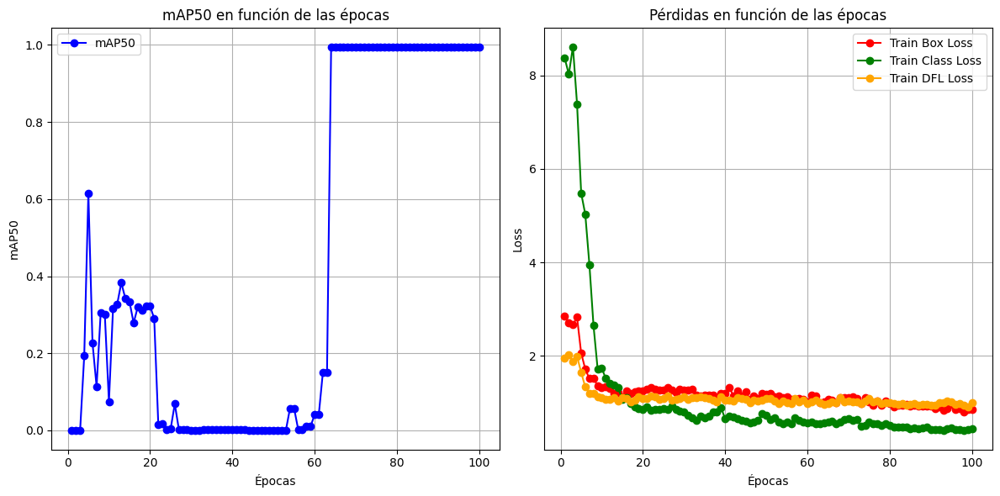

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV
logs = pd.read_csv('/content/runs/detect/train8/results.csv')

# Extraer las épocas
epochs = logs['epoch']

# Graficar métricas
plt.figure(figsize=(12, 6))

# Subplot para mAP50
plt.subplot(1, 2, 1)
plt.plot(epochs, logs['metrics/mAP50(B)'], label='mAP50', marker='o', color='blue')
plt.xlabel('Épocas')
plt.ylabel('mAP50')
plt.title('mAP50 en función de las épocas')
plt.grid(True)
plt.legend()

# Subplot para las pérdidas
plt.subplot(1, 2, 2)
plt.plot(epochs, logs['train/box_loss'], label='Train Box Loss', marker='o', color='red')
plt.plot(epochs, logs['train/cls_loss'], label='Train Class Loss', marker='o', color='green')
plt.plot(epochs, logs['train/dfl_loss'], label='Train DFL Loss', marker='o', color='orange')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.title('Pérdidas en función de las épocas')
plt.grid(True)
plt.legend()

# Ajustar el layout
plt.tight_layout()
plt.show()


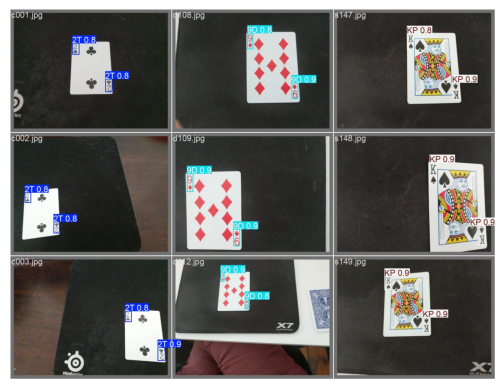

In [ ]:
import matplotlib.pyplot as plt
import cv2

# Cargar la imagen
image_path = "/content/runs/detect/train8/val_batch0_pred.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB

# Mostrar la imagen
plt.imshow(image)
plt.axis("off")
plt.show()



image 1/1 /content/drive/MyDrive/YOLO_class/data/test/s161.jpg: 480x640 2 KPs, 117.7ms
Speed: 14.6ms preprocess, 117.7ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


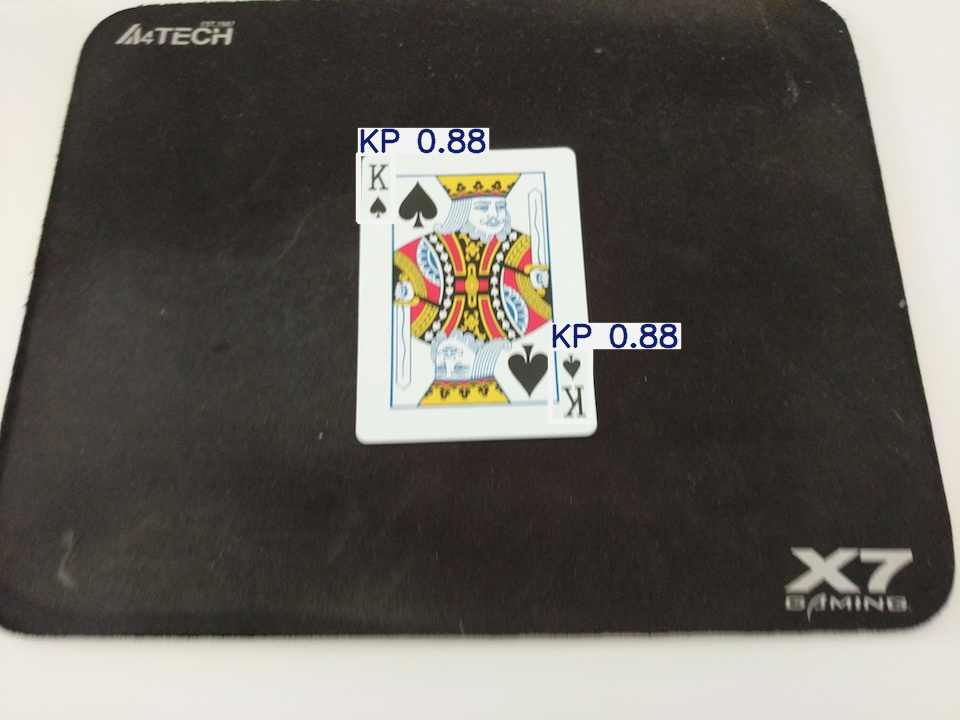

In [ ]:
new_model = YOLO('/content/runs/detect/train8/weights/best.pt')

# Realizar la detección
results = new_model('/content/drive/MyDrive/YOLO_class/data/test');

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    #masks = result.masks  # Masks object for segmentation masks outputs
    #keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    #obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen